#  Analyzing Covid-19 data 

- To analyze the covid-19 trend from January,2020 to June,2021.
- Goto https://api.covid19india.org/ and find the raw CSV data.


### How to run the code

This is an executable [*Jupyter notebook*](https://jupyter.org) hosted on [Jovian.ml](https://www.jovian.ml), a platform for sharing data science projects. You can run and experiment with the code in a couple of ways: *using free online resources* (recommended) or *on your own computer*.

#### Option 1: Running using free online resources (1-click, recommended)

The easiest way to start executing this notebook is to click the "Run" button at the top of this page, and select "Run on Binder". This will run the notebook on [mybinder.org](https://mybinder.org), a free online service for running Jupyter notebooks. You can also select "Run on Colab" or "Run on Kaggle".


#### Option 2: Running on your computer locally

1. Install Conda by [following these instructions](https://conda.io/projects/conda/en/latest/user-guide/install/index.html). Add Conda binaries to your system `PATH`, so you can use the `conda` command on your terminal.

2. Create a Conda environment and install the required libraries by running these commands on the terminal:

```
conda create -n zerotopandas -y python=3.8 
conda activate zerotopandas
pip install jovian jupyter numpy pandas matplotlib seaborn opendatasets --upgrade
```

3. Press the "Clone" button above to copy the command for downloading the notebook, and run it on the terminal. This will create a new directory and download the notebook. The command will look something like this:

```
jovian clone notebook-owner/notebook-id
```



4. Enter the newly created directory using `cd directory-name` and start the Jupyter notebook.

```
jupyter notebook
```

You can now access Jupyter's web interface by clicking the link that shows up on the terminal or by visiting http://localhost:8888 on your browser. Click on the notebook file (it has a `.ipynb` extension) to open it.


## Downloading the Dataset


 Goto website https://api.covid19india.org/ and find the raw data.
 

In [1]:
!pip install jovian opendatasets --upgrade --quiet

In [2]:
import jovian

In [3]:
jovian.commit(project = "zerotopandas-course-project", environment = 'auto')

<IPython.core.display.Javascript object>

[jovian] Updating notebook "shahdarshil622/zerotopandas-course-project" on https://jovian.ai
[jovian] Committed successfully! https://jovian.ai/shahdarshil622/zerotopandas-course-project


'https://jovian.ai/shahdarshil622/zerotopandas-course-project'

Let's begin by downloading the data, and listing the files within the dataset.

In [4]:
!pip install opendatasets --upgrade --quiet

In [5]:
# Data URL
dataset_url = 'https://api.covid19india.org/csv/latest/states.csv' 

In [6]:
import opendatasets as od
od.download(dataset_url)

Using downloaded and verified file: ./states.csv


## Data Preparation and Cleaning

In this step we will first read the csv file data and process missing data and exact all the relevent data.



In [7]:
import pandas as pd
import numpy as np

In [8]:
states_df = pd.read_csv('states.csv')

In [9]:
states_df

,Date,State,Confirmed,Recovered,Deceased,Other,Tested
0,2020-01-30,Kerala,1,0,0,0,NaN
1,2020-01-30,India,1,0,0,0,NaN
2,2020-02-02,Kerala,2,0,0,0,NaN
3,2020-02-02,India,2,0,0,0,NaN
4,2020-02-03,Kerala,3,0,0,0,NaN
...,...,...,...,...,...,...,...
16823,2021-06-22,Tripura,62742,58120,651,23,1220186.0
16824,2021-06-22,India,30027883,28987479,390691,11810,395973198.0
16825,2021-06-22,Uttar Pradesh,1704678,1678486,22282,0,55730488.0
16826,2021-06-22,Uttarakhand,338978,323225,7052,5805,5338677.0


In [10]:
states_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16828 entries, 0 to 16827
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       16828 non-null  object 
 1   State      16828 non-null  object 
 2   Confirmed  16828 non-null  int64  
 3   Recovered  16828 non-null  int64  
 4   Deceased   16828 non-null  int64  
 5   Other      16828 non-null  int64  
 6   Tested     16074 non-null  float64
dtypes: float64(1), int64(4), object(2)
memory usage: 920.4+ KB


we can infer that there are 16347 rows and and total 7 columns in the dataset. Tested column has less number of data present that is some data is missing(**NaN**). Hence we need to do some processing on the data.

In [11]:
missing_data = states_df['Tested'].isnull().sum()
print("The total number of missing data in Tested column is {}".format(missing_data))

The total number of missing data in Tested column is 754


Now to replace the missing values with float value 0.

In [12]:
states_df['Tested']= states_df['Tested'].replace(np.nan,0)

In [13]:
states_df

,Date,State,Confirmed,Recovered,Deceased,Other,Tested
0,2020-01-30,Kerala,1,0,0,0,0.0
1,2020-01-30,India,1,0,0,0,0.0
2,2020-02-02,Kerala,2,0,0,0,0.0
3,2020-02-02,India,2,0,0,0,0.0
4,2020-02-03,Kerala,3,0,0,0,0.0
...,...,...,...,...,...,...,...
16823,2021-06-22,Tripura,62742,58120,651,23,1220186.0
16824,2021-06-22,India,30027883,28987479,390691,11810,395973198.0
16825,2021-06-22,Uttar Pradesh,1704678,1678486,22282,0,55730488.0
16826,2021-06-22,Uttarakhand,338978,323225,7052,5805,5338677.0


In [14]:
states_df['Tested'].count()

16828

In [15]:
states_df.describe()

,Confirmed,Recovered,Deceased,Other,Tested
count,1.682800e+04,1.682800e+04,16828.000000,16828.000000,1.682800e+04
mean,4.668210e+05,4.235816e+05,6317.953649,164.664607,7.394975e+06
std,1.972996e+06,1.804197e+06,25660.405527,848.352556,2.892208e+07
min,0.000000e+00,0.000000e+00,0.000000,-1.000000,0.000000e+00
25%,3.540000e+03,2.513000e+03,22.000000,0.000000,7.747650e+04
50%,3.342100e+04,2.893000e+04,468.500000,0.000000,5.448015e+05
75%,2.711422e+05,2.584065e+05,3194.750000,3.000000,5.793953e+06
max,3.002788e+07,2.898748e+07,390691.000000,11810.000000,3.959732e+08


In [16]:
from datetime import datetime
dates = np.array([datetime.strptime(i,"%Y-%m-%d") for i in states_df.Date])
con_dates = np.array([datetime.strftime(i,"%d %b %Y") for i in  dates])
states_df['Date'] = con_dates

In [17]:
states_df

,Date,State,Confirmed,Recovered,Deceased,Other,Tested
0,30 Jan 2020,Kerala,1,0,0,0,0.0
1,30 Jan 2020,India,1,0,0,0,0.0
2,02 Feb 2020,Kerala,2,0,0,0,0.0
3,02 Feb 2020,India,2,0,0,0,0.0
4,03 Feb 2020,Kerala,3,0,0,0,0.0
...,...,...,...,...,...,...,...
16823,22 Jun 2021,Tripura,62742,58120,651,23,1220186.0
16824,22 Jun 2021,India,30027883,28987479,390691,11810,395973198.0
16825,22 Jun 2021,Uttar Pradesh,1704678,1678486,22282,0,55730488.0
16826,22 Jun 2021,Uttarakhand,338978,323225,7052,5805,5338677.0


In [ ]:
jovian.commit(project='zerotopandas-course-project', environment='auto',files=['states.csv'])

##  Restructuring the data

Data is in cumulated formate we need to get data for every day by substracting individual days from the prior ones.

In [18]:
no_of_days = len(states_df['Date'].unique())
print("We have data for {} days".format(no_of_days))

We have data for 482 days


In [19]:
group_dates_df = states_df.groupby(['Date','State'],sort=False).sum()

In [20]:
group_dates_df

Confirmed  Recovered  Deceased  Other       Tested
Date        State                                                            
30 Jan 2020 Kerala                 1          0         0      0          0.0
            India                  1          0         0      0          0.0
02 Feb 2020 Kerala                 2          0         0      0          0.0
            India                  2          0         0      0          0.0
03 Feb 2020 Kerala                 3          0         0      0          0.0
...                              ...        ...       ...    ...          ...
22 Jun 2021 Tripura            62742      58120       651     23    1220186.0
            India           30027883   28987479    390691  11810  395973198.0
            Uttar Pradesh    1704678    1678486     22282      0   55730488.0
            Uttarakhand       338978     323225      7052   5805    5338677.0
            West Bengal      1485438    1445493     17437      0   13783866.0

[16828 rows x 5 columns]

In [21]:
group_dates_df.head(20)

Confirmed  Recovered  Deceased  Other  Tested
Date        State                                                   
30 Jan 2020 Kerala             1          0         0      0     0.0
            India              1          0         0      0     0.0
02 Feb 2020 Kerala             2          0         0      0     0.0
            India              2          0         0      0     0.0
03 Feb 2020 Kerala             3          0         0      0     0.0
            India              3          0         0      0     0.0
14 Feb 2020 Kerala             3          3         0      0     0.0
            India              3          3         0      0     0.0
02 Mar 2020 Delhi              1          0         0      0     0.0
            Kerala             3          3         0      0     0.0
            Telangana          1          0         0      0     0.0
            India              5          3         0      0     0.0
03 Mar 2020 Delhi              1          0         0      0     0.0
            Kerala             3          3         0      0     0.0
            Rajasthan          1          0         0      0     0.0
            Telangana          1          0         0      0     0.0
            India              6          3         0      0     0.0
04 Mar 2020 Delhi              1          0         0      0     0.0
            Haryana           14          0         0      0     0.0
            Kerala             3          3         0      0     0.0

In [22]:
days = states_df['Date'].unique()
states = states_df['State'].unique()
cum_confirmed_df = pd.DataFrame(data = 0, index = days, columns = states )
cum_recovered_df = pd.DataFrame(data = 0, index = days, columns = states )
cum_deceased_df = pd.DataFrame(data = 0, index = days, columns = states )
cum_other_df = pd.DataFrame(data = 0, index = days, columns = states )
cum_tested_df = pd.DataFrame(data = 0, index = days, columns = states )

In [23]:
dates = np.array(days)
dates

array(['30 Jan 2020', '02 Feb 2020', '03 Feb 2020', '14 Feb 2020',
       '02 Mar 2020', '03 Mar 2020', '04 Mar 2020', '05 Mar 2020',
       '06 Mar 2020', '07 Mar 2020', '08 Mar 2020', '09 Mar 2020',
       '10 Mar 2020', '11 Mar 2020', '12 Mar 2020', '13 Mar 2020',
       '14 Mar 2020', '15 Mar 2020', '16 Mar 2020', '17 Mar 2020',
       '18 Mar 2020', '19 Mar 2020', '20 Mar 2020', '21 Mar 2020',
       '22 Mar 2020', '23 Mar 2020', '24 Mar 2020', '25 Mar 2020',
       '26 Mar 2020', '27 Mar 2020', '28 Mar 2020', '29 Mar 2020',
       '30 Mar 2020', '31 Mar 2020', '01 Apr 2020', '02 Apr 2020',
       '03 Apr 2020', '04 Apr 2020', '05 Apr 2020', '06 Apr 2020',
       '07 Apr 2020', '08 Apr 2020', '09 Apr 2020', '10 Apr 2020',
       '11 Apr 2020', '12 Apr 2020', '13 Apr 2020', '14 Apr 2020',
       '15 Apr 2020', '16 Apr 2020', '17 Apr 2020', '18 Apr 2020',
       '19 Apr 2020', '20 Apr 2020', '21 Apr 2020', '22 Apr 2020',
       '23 Apr 2020', '24 Apr 2020', '25 Apr 2020', '26 Apr 20

In [24]:
for date in dates:
    arr = group_dates_df.loc[date]
    state_names = np.array(arr.index)
    confirmed_values = np.array([int(arr.loc[i]['Confirmed'])  for i in state_names])
    cum_confirmed_df.loc[date][state_names] = confirmed_values
    recovered_values = np.array([int(arr.loc[i]['Recovered'])  for i in state_names])
    cum_recovered_df.loc[date][state_names] = recovered_values
    deceased_values = np.array([int(arr.loc[i]['Deceased'])  for i in state_names])
    cum_deceased_df.loc[date][state_names] = deceased_values
    other_values = np.array([int(arr.loc[i]['Other'])  for i in state_names])
    cum_other_df.loc[date][state_names] = other_values
    tested_values = np.array([int(arr.loc[i]['Tested'])  for i in state_names])
    cum_tested_df.loc[date][state_names] = tested_values
    
    
    

In [25]:
cum_confirmed_df

,Kerala,India,Delhi,Telangana,Rajasthan,Haryana,Uttar Pradesh,Ladakh,Tamil Nadu,Jammu and Kashmir,...,Assam,Jharkhand,Arunachal Pradesh,Nagaland,Tripura,Dadra and Nagar Haveli and Daman and Diu,Meghalaya,Sikkim,State Unassigned,Lakshadweep
30 Jan 2020,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
02 Feb 2020,2,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
03 Feb 2020,3,3,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14 Feb 2020,3,3,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
02 Mar 2020,3,5,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18 Jun 2021,2785305,29822790,1432033,610834,950768,767047,1703882,19730,2406497,310688,...,477159,344270,32692,24097,61336,10502,44382,19058,0,9392
19 Jun 2021,2797748,29881405,1432168,612196,950961,767217,1704139,19783,2414680,311209,...,480730,344405,32923,24191,61779,10512,44896,19209,0,9430
20 Jun 2021,2809395,29934383,1432292,613202,951105,767418,1704358,19805,2422497,311794,...,482505,344543,33081,24248,62146,10515,45286,19296,0,9443
21 Jun 2021,2816844,29977066,1432381,614399,951256,767580,1704476,19838,2429924,312156,...,485310,344665,33375,24374,62321,10518,45555,19321,0,9471


In [26]:
confirmed_df = cum_confirmed_df.copy()
tested_df = cum_tested_df.copy()
deceased_df = cum_deceased_df.copy()
recovered_df = cum_recovered_df.copy()
for i in range(1,no_of_days):
    confirmed_df.iloc[i] = cum_confirmed_df.iloc[i] - cum_confirmed_df.iloc[i-1]
    tested_df.iloc[i] = cum_tested_df.iloc[i] - cum_tested_df.iloc[i-1]
    deceased_df.iloc[i] = cum_deceased_df.iloc[i] - cum_deceased_df.iloc[i-1]
    recovered_df.iloc[i]= cum_recovered_df.iloc[i] - cum_recovered_df.iloc[i-1]

In [27]:
deceased_df

,Kerala,India,Delhi,Telangana,Rajasthan,Haryana,Uttar Pradesh,Ladakh,Tamil Nadu,Jammu and Kashmir,...,Assam,Jharkhand,Arunachal Pradesh,Nagaland,Tripura,Dadra and Nagar Haveli and Daman and Diu,Meghalaya,Sikkim,State Unassigned,Lakshadweep
30 Jan 2020,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
02 Feb 2020,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
03 Feb 2020,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14 Feb 2020,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
02 Mar 2020,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18 Jun 2021,90,1645,14,12,9,36,51,0,287,8,...,33,2,1,1,3,0,9,3,0,0
19 Jun 2021,115,1574,7,10,7,33,51,1,180,4,...,40,2,0,1,5,0,5,1,0,1
20 Jun 2021,112,1424,7,11,4,30,46,1,182,14,...,30,0,0,1,4,0,4,2,0,0
21 Jun 2021,94,1167,11,9,6,29,46,0,189,10,...,35,1,0,6,4,0,5,0,0,0


In [28]:
total_cases = confirmed_df.sum()
total_cases.sort_values(ascending = False,inplace=True)
total_cases_df = pd.DataFrame(total_cases[1:])
total_cases_df = total_cases_df.rename(columns = {0:'Cases'})
total_cases_df

,Cases
Maharashtra,5987521
Kerala,2829461
Karnataka,2815029
Tamil Nadu,2436819
Andhra Pradesh,1857352
Uttar Pradesh,1704678
West Bengal,1485438
Delhi,1432778
Chhattisgarh,991653
Rajasthan,951393


In [29]:
total_deaths = deceased_df.sum()
total_deaths.sort_values(ascending = False, inplace = True)
total_deaths_df = pd.DataFrame(total_deaths)
total_deaths_df = total_deaths_df.rename(columns = {0:'Deaths'})
total_deaths_df['Percent'] = np.around(np.array((total_deaths_df['Deaths']/total_deaths_df['Deaths'][0])*100),decimals=2)
total_deaths_df = total_deaths_df[1:]
total_deaths_df

,Deaths,Percent
Maharashtra,118795,30.41
Karnataka,34164,8.74
Tamil Nadu,31580,8.08
Delhi,24933,6.38
Uttar Pradesh,22282,5.70
West Bengal,17437,4.46
Punjab,15888,4.07
Chhattisgarh,13402,3.43
Andhra Pradesh,12416,3.18
Kerala,12296,3.15


In [30]:
daily_total_tests_df = tested_df['India']
daily_total_tests_df

30 Jan 2020          0
02 Feb 2020          0
03 Feb 2020          0
14 Feb 2020          0
02 Mar 2020          0
                ...   
18 Jun 2021    2039941
19 Jun 2021    1811446
20 Jun 2021    1388699
21 Jun 2021    1664360
22 Jun 2021    1901056
Name: India, Length: 482, dtype: int64

In [31]:
print("Total number of tests done in India are {0:.2f} million ".format(daily_total_tests_df.sum()/1000000))

Total number of tests done in India are 395.97 million 


In [ ]:
jovian.commit(project='zerotopandas-course-project', environment='auto',files=['states.csv'])

## Exploratory Analysis and Visualization

Now we will explore the data and make some visualizations.



Let's begin by importing`matplotlib.pyplot` and `seaborn`.

In [32]:
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (9, 5)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

**TODO** - To draw a bar chart race for number of cases from 2020 to 2021

In [33]:
!pip install bar_chart_race --upgrade --quiet

In [34]:
import bar_chart_race as bcr

In [35]:

bcr.bar_chart_race(
    df = cum_confirmed_df,
    filename = None,
    orientation ='h',
    sort ='desc',
    n_bars =10,
    title = 'Number of Covid cases in India')

/opt/conda/lib/python3.8/site-packages/bar_chart_race/_make_chart.py:286: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(self.df_values.columns)
/opt/conda/lib/python3.8/site-packages/bar_chart_race/_make_chart.py:287: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([max_val] * len(ax.get_xticks()))
/opt/conda/lib/python3.8/site-packages/bar_chart_race/_make_chart.py:226: UserWarning: Some of your columns never make an appearance in the animation. To reduce color repetition, set `filter_column_colors` to `True`
  warnings.warn("Some of your columns never make an appearance in the animation. "


In [ ]:
jovian.commit(project='zerotopandas-course-project', environment='auto',files=['states.csv'])

**TODO** - Plot the covid-19 trend in India

In [36]:
x_axis =  total_cases_df['Cases']/1000000
print(x_axis)
y_axis = total_cases_df.index
print(y_axis)

Maharashtra                                 5.987521
Kerala                                      2.829461
Karnataka                                   2.815029
Tamil Nadu                                  2.436819
Andhra Pradesh                              1.857352
Uttar Pradesh                               1.704678
West Bengal                                 1.485438
Delhi                                       1.432778
Chhattisgarh                                0.991653
Rajasthan                                   0.951393
Odisha                                      0.883490
Gujarat                                     0.822620
Madhya Pradesh                              0.789415
Haryana                                     0.767726
Bihar                                       0.720207
Telangana                                   0.615574
Punjab                                      0.593063
Assam                                       0.488179
Jharkhand                                   0.

Text(0.5, 1.0, 'Top states with cases')

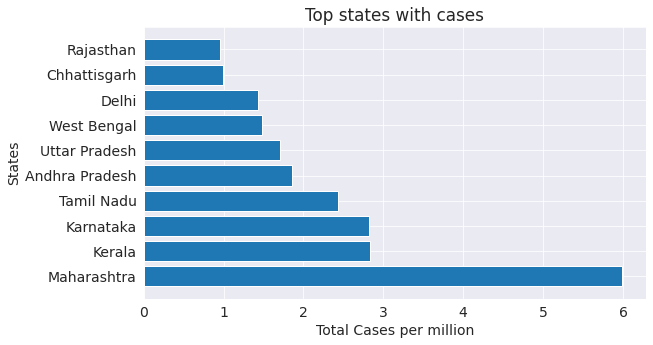

In [37]:
plt.barh(y_axis[0:10],x_axis[0:10])
plt.xlabel('Total Cases per million')
plt.ylabel('States')
plt.title('Top states with cases')

 **TODO** - To make scatter plot of person deceases vs cases and find the co relation

<AxesSubplot:xlabel='Confirmed', ylabel='Deceased'>

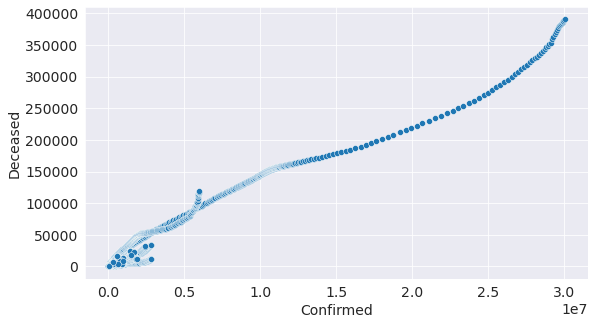

In [38]:
sns.scatterplot(data = states_df, x='Confirmed', y='Deceased')

This shows that the deaths reported has linear correlation with cases reported 

**TODO** -  States with highest number of deaths

The below chart represents 78% of total deaths in India


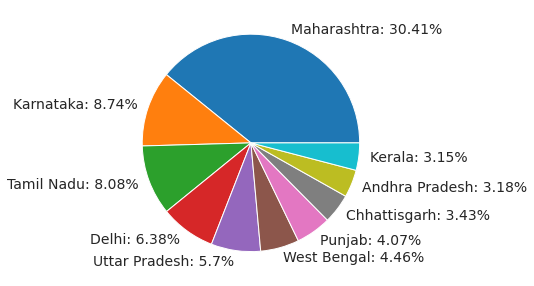

In [39]:
deaths = total_deaths_df['Percent'][0:10]
lables = [i+": "+str(total_deaths_df['Percent'][i])+"%" for i in total_deaths_df.index][0:10]
plt.pie(deaths, labels = lables);
print("The below chart represents {}% of total deaths in India".format(round(deaths.sum())))

**TODO** - Plot trend of covid cases

{'Jan,2020': 2, 'Feb,2020': 4, 'Mar,2020': 3264, 'Apr,2020': 66464, 'May,2020': 311562, 'Jun,2020': 790286, 'Jul,2020': 2222526, 'Aug,2020': 3981776, 'Sep,2020': 5244648, 'Oct,2020': 3746260, 'Nov,2020': 2559720, 'Dec,2020': 1646112, 'Jan,2021': 944634, 'Feb,2021': 706856, 'Mar,2021': 2217320, 'Apr,2021': 13872958, 'May,2021': 18033374, 'Jun,2021': 3708000}


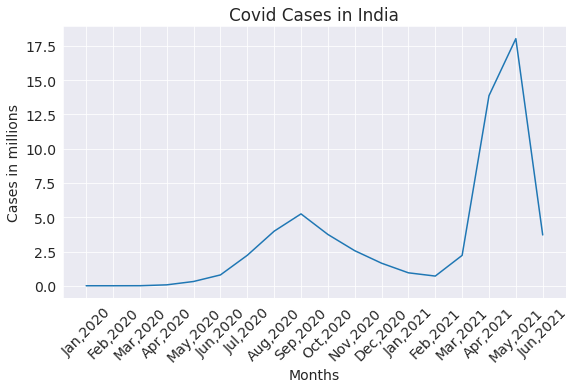

In [40]:
month_cases = {}
cases_indexes = confirmed_df.sum(axis=1)
for date in cases_indexes.index:
    month = date[3:6]
    year = date[7:]
    month_year = month +","+ year
    month_cases[month_year] = month_cases.get(month_year,0) + cases_indexes[date]
print(month_cases)

month_df = pd.DataFrame(month_cases.values(),index = month_cases.keys()).rename(columns ={0:'Cases'})

x = month_df.index
y = month_df['Cases']/1000000
plt.plot(x,y)
plt.xlabel("Months")
plt.ylabel("Cases in millions")
plt.xticks(rotation = 45)
plt.title("Covid Cases in India")
plt.show()

In [ ]:
jovian.commit(project='zerotopandas-course-project', environment='auto',files=['states.csv'])

Let us save and upload our work to Jovian before continuing

## Asking and Answering Questions





#### Q1: which state has highest number of cases

In [41]:
highest_cases = total_cases_df.index[0]

In [42]:
print("State with highest number of covid cases is \033[1m{}\033[0m.".format(highest_cases))

State with highest number of covid cases is Maharashtra.


#### Q2: How state has highest recovery?

In [43]:
recovered = recovered_df.sum()
cases =  confirmed_df.sum()
percent_recovered =  (recovered/cases)*100
percent_recovered.drop('India',inplace = True)
print("State that has highest recovery is\033[1m {}\033[0m ".format(percent_recovered.sort_values(ascending=False).index[0]))

State that has highest recovery is Dadra and Nagar Haveli and Daman and Diu 


#### Q3: Which month has highest active cases?

From Graph 5 we can tell that **May 2021** is having the highest number of covid cases

#### Q4: when deaths crossed  100k?

In [44]:
death_india = cum_deceased_df['India']
cases_crossed = 100000
print("On \033[1m{}\033[0m number of deaths crossed {} thousands".format(death_india[death_india >= cases_crossed].index[0], cases_crossed/1000))

On 02 Oct 2020 number of deaths crossed 100.0 thousands


In [45]:
jovian.commit(project='zerotopandas-course-project',environment='auto',files=['states.csv'])

<IPython.core.display.Javascript object>

[jovian] Updating notebook "shahdarshil622/zerotopandas-course-project" on https://jovian.ai
[jovian] Uploading additional files...
[jovian] Committed successfully! https://jovian.ai/shahdarshil622/zerotopandas-course-project


'https://jovian.ai/shahdarshil622/zerotopandas-course-project'

## Inferences and Conclusion

We can infer that covid cases actively began to rise from May 200 and fall in Dec 2020 and then again rise in March 2021 to May 2021. We can say that Maharashtra has seen more number of cases and deaths than any other state. 


In [46]:
jovian.commit(project='zerotopandas-course-project', environment='auto',files=['states.csv'])

<IPython.core.display.Javascript object>

[jovian] Updating notebook "shahdarshil622/zerotopandas-course-project" on https://jovian.ai
[jovian] Uploading additional files...
[jovian] Committed successfully! https://jovian.ai/shahdarshil622/zerotopandas-course-project


'https://jovian.ai/shahdarshil622/zerotopandas-course-project'

## References:
- Bar chart race: https://www.dexplo.org/bar_chart_race/data_preparation/
- Matplotlib:     https://matplotlib.org/ 
- Seaborn:        https://seaborn.pydata.org/
- Covid Data:     https://api.covid19india.org/


In [ ]:
jovian.commit(project='zerotopandas-course-project', environment='conda',files=['states.csv'])

<IPython.core.display.Javascript object>